# 1.結果の取得


In [ ]:
import pandas as pd

Hammett_lcb_path = "../BO_result/target_relative/initsize5_LCB_per_dim/Hammett/Hammett_p_0.95_init5_picks_lcb.csv"
df_Hammett_lcb = pd.read_csv(Hammett_lcb_path)

FP_lcb_path = "../BO_result/target_relative/initsize5_LCB_per_dim/FP/FP_p_0.95_init5_picks_lcb.csv"
df_FP_lcb = pd.read_csv(FP_lcb_path)

Random_path = "../BO_result/target_relative/initsize5_LCB_per_dim/Hammett/Hammett_p_0.95_init5_picks_rand.csv"
df_Random = pd.read_csv(Random_path)

distance_path = "../BO_result/distances/scaled_distance_table.csv"
df_distance = pd.read_csv(distance_path)


# print("Hammett LCB DataFrame:")
# print(df_Hammett_lcb.head())
# print("distances_Index")
# print(df_distance.head())

,Unnamed: 0,distance_scaled
0,0,0.460599
1,1,0.542417
2,2,0.563358
3,3,0.236337
4,4,0.260656
...,...,...
251,251,0.980616
252,252,0.607008
253,253,0.694135
254,254,0.885345


# 2.インデックス距離を対応

In [10]:
# 1) mapping 辞書を作成
#    dist_col に 'distance' でも 'eucled_distance' でも OK
dist_map = df_distance["distance_scaled"].to_dict()  # Series

# 2) run 名を index に設定して、applymap で全セルを置換
Hammett_distance = (
    df_Hammett_lcb
    .set_index('Unnamed: 0')                   
    .applymap(lambda idx: dist_map.get(idx, pd.NA))  # index → 距離
)

FP_distance = (
    df_FP_lcb
    .set_index('Unnamed: 0')                   
    .applymap(lambda idx: dist_map.get(idx, pd.NA))  # index → 距離
)

Random_distance = (
    df_Random
    .set_index('Unnamed: 0')                   
    .applymap(lambda idx: dist_map.get(idx, pd.NA))  # index → 距離
)

# Hammett_distance

In [11]:
Hammett_distance_best = Hammett_distance.cummin(axis=1)
Hammett_distance_best.to_csv("../BO_result/distances/Hammett_distance_best.csv")
FP_distance_best = FP_distance.cummin(axis=1)
Random_distance_best = Random_distance.cummin(axis=1)

# Random_distance_best

# 3.可視化

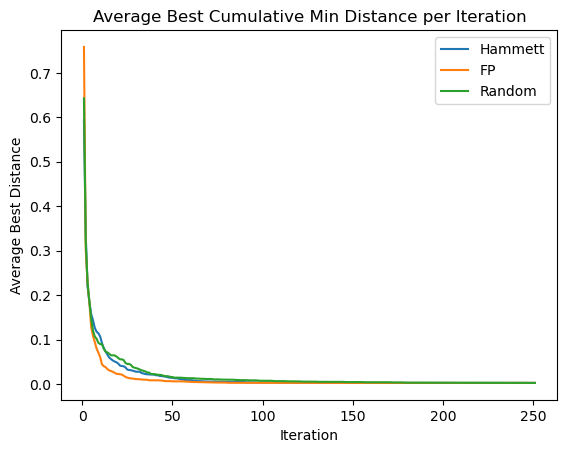

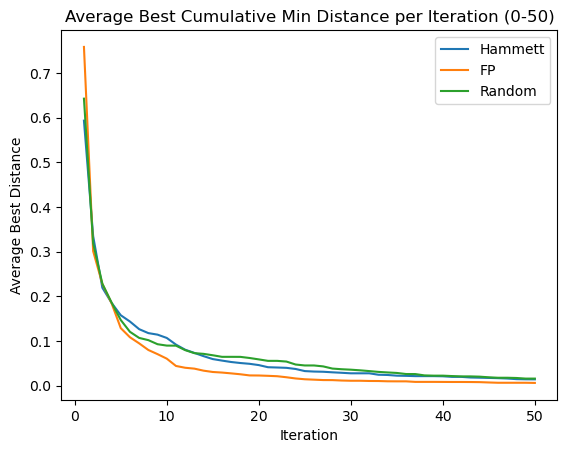

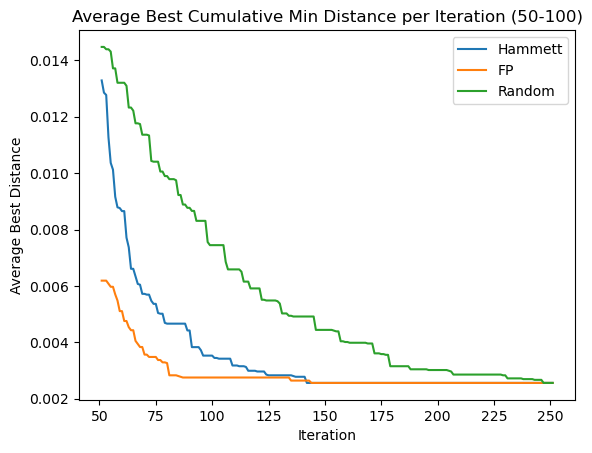

In [13]:
import matplotlib.pyplot as plt

# Compute the average best distance across runs for each method
mean_hammett = Hammett_distance_best.mean(axis=0)
mean_fp = FP_distance_best.mean(axis=0)
mean_random = Random_distance_best.mean(axis=0)

var_hammett = Hammett_distance_best.var(axis=0)
var_fp = FP_distance_best.var(axis=0)
var_random = Random_distance_best.var(axis=0)
# X-axis: iteration numbers
iterations = range(1, len(mean_hammett) + 1)

# Plotting
plt.figure()
plt.plot(iterations, mean_hammett, label='Hammett')
plt.plot(iterations, mean_fp, label='FP')
plt.plot(iterations, mean_random, label='Random')
plt.xlabel("Iteration")
plt.ylabel("Average Best Distance")
plt.title("Average Best Cumulative Min Distance per Iteration")
plt.legend()
plt.show()

# 0-50,50-100に拡大
plt.figure()
plt.plot(iterations[:50], mean_hammett[:50], label='Hammett')
plt.plot(iterations[:50], mean_fp[:50], label='FP')
plt.plot(iterations[:50], mean_random[:50], label='Random')
plt.xlabel("Iteration")
plt.ylabel("Average Best Distance")
plt.title("Average Best Cumulative Min Distance per Iteration (0-50)")
plt.legend()
plt.show()

plt.figure()
plt.plot(iterations[50:], mean_hammett[50:], label='Hammett')
plt.plot(iterations[50:], mean_fp[50:], label='FP')
plt.plot(iterations[50:], mean_random[50:], label='Random')
plt.xlabel("Iteration")
plt.ylabel("Average Best Distance")
plt.title("Average Best Cumulative Min Distance per Iteration (50-100)")
plt.legend()
plt.show()



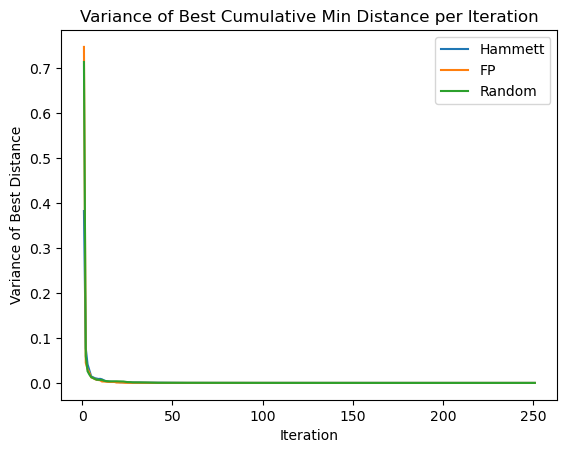

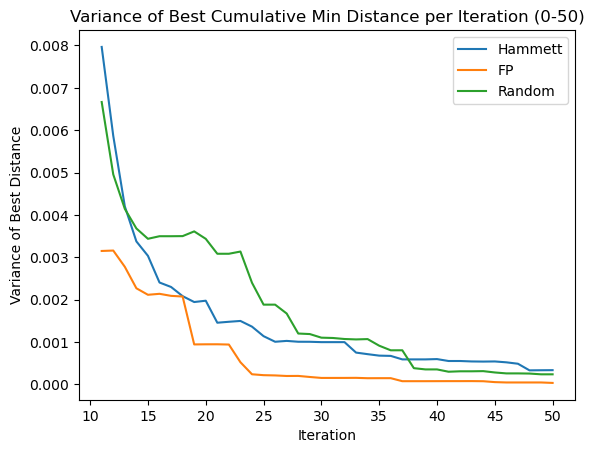

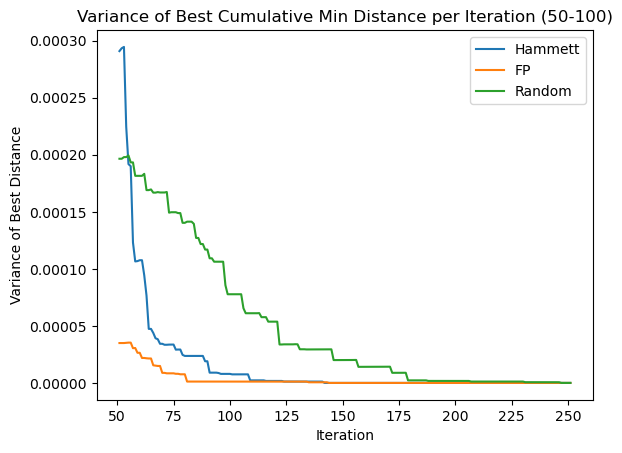

In [14]:
var_hammett = Hammett_distance_best.var(axis=0)
var_fp = FP_distance_best.var(axis=0)
var_random = Random_distance_best.var(axis=0)
# Plotting variance
plt.figure()
plt.plot(iterations, var_hammett, label='Hammett')
plt.plot(iterations, var_fp, label='FP')
plt.plot(iterations, var_random, label='Random')
plt.xlabel("Iteration")
plt.ylabel("Variance of Best Distance")
plt.title("Variance of Best Cumulative Min Distance per Iteration")
plt.legend()
plt.show()
# 0-50,50-100に拡大
plt.figure()
plt.plot(iterations[10:50], var_hammett[10:50], label='Hammett')
plt.plot(iterations[10:50], var_fp[10:50], label='FP')
plt.plot(iterations[10:50], var_random[10:50], label='Random')
plt.xlabel("Iteration")     
plt.ylabel("Variance of Best Distance")
plt.title("Variance of Best Cumulative Min Distance per Iteration (0-50)")
plt.legend()
plt.show()

plt.figure()
plt.plot(iterations[50:], var_hammett[50:], label='Hammett')
plt.plot(iterations[50:], var_fp[50:], label='FP')
plt.plot(iterations[50:], var_random[50:], label='Random')
plt.xlabel("Iteration")
plt.ylabel("Variance of Best Distance")
plt.title("Variance of Best Cumulative Min Distance per Iteration (50-100)")
plt.legend()
plt.show()

# 4.PCAの結果

In [15]:
Hammett_features_path = "../train/result0.xlsx"
FP_features_path = "../FP_BO.ipynb/fp.csv"


Hammett_features = pd.read_excel(Hammett_features_path)
FP_features = pd.read_csv(FP_features_path)

# Hammett_features.head()

Hammett_cols = ["Index 14", "Index 15", "Index 16", "Index 0", "Index 20"]

df_FP_NONE1 = FP_features.loc[:, FP_features.nunique(dropna=False) > 1]

# カラム名リスト
FP_cols = df_FP_NONE1.columns.tolist()
print("FP_cols:", len(FP_cols))

FP_cols: 189


寄与率（各主成分の分散説明率）: [0.21907394 0.1590136 ]
累積寄与率: [0.21907394 0.37808753]


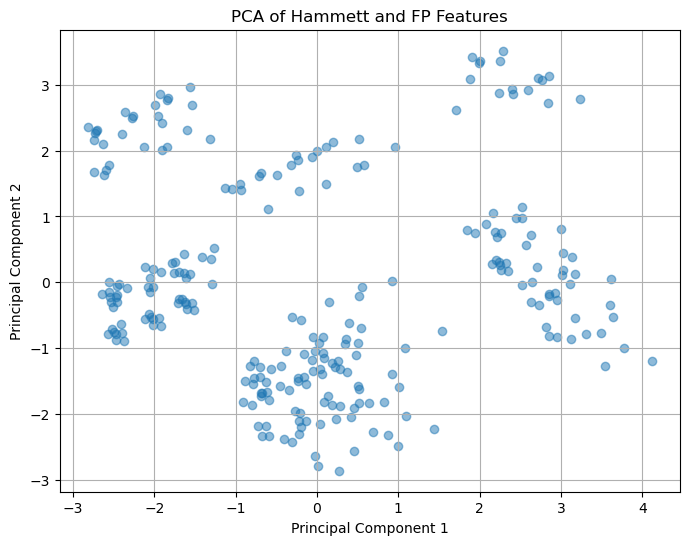

In [16]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD, PCA
import numpy as np

# 1) Hammett（例：3 列）を標準化
sc_h = StandardScaler()
X_h = sc_h.fit_transform(Hammett_features[Hammett_cols])

# 2) FP（例：1024 列）は TruncatedSVD で 10 次元に圧縮
svd = TruncatedSVD(n_components=10, random_state=42)
X_f = svd.fit_transform(FP_features[FP_cols])
# X_f = FP_features[FP_cols].values

# 3) それぞれを結合して，最終的に 2 次元 PCA
X_concat = np.hstack([X_h, X_f])
sc_all = StandardScaler()
X_std = sc_all.fit_transform(X_concat)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_concat)

# 4) 寄与率を出力
print("寄与率（各主成分の分散説明率）:", pca.explained_variance_ratio_)
print("累積寄与率:", pca.explained_variance_ratio_.cumsum())


pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df

# Plotting the PCA results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5)
plt.title('PCA of Hammett and FP Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

# 各軸の寄与率を表示




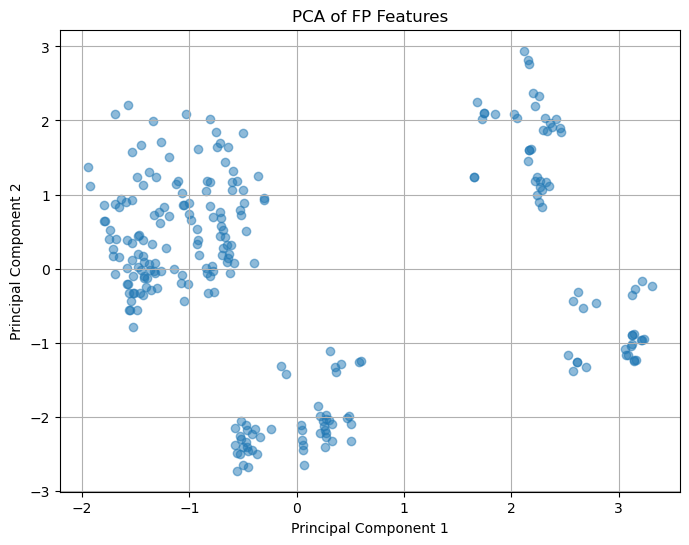

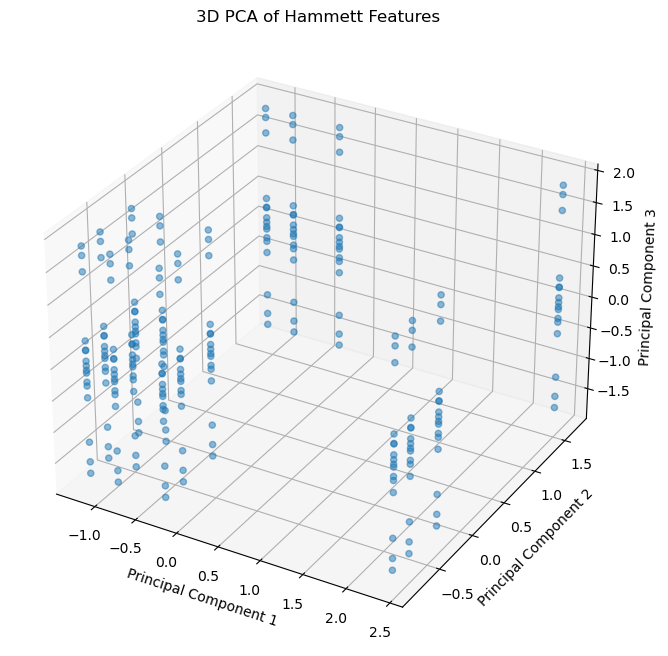

In [61]:
pca_FP = PCA(n_components=2)
X_pca_FP = pca_FP.fit_transform(FP_features[FP_cols])
pca_FP_df = pd.DataFrame(X_pca_FP, columns=['PC1', 'PC2'])
# Plotting the PCA results for FP features
plt.figure(figsize=(8, 6))
plt.scatter(pca_FP_df['PC1'], pca_FP_df['PC2'], alpha=0.5)
plt.title('PCA of FP Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

pca_Hammett = PCA(n_components=3)
X_pca_Hammett = pca_Hammett.fit_transform(X_h)
pca_Hammett_df = pd.DataFrame(X_pca_Hammett, columns=['PC1', 'PC2', 'PC3'])
# 3D plot for Hammett features
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_Hammett_df['PC1'], pca_Hammett_df['PC2'], pca_Hammett_df['PC3'], alpha=0.5)
ax.set_title('3D PCA of Hammett Features')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')

plt.show()

# 5.PCA VS distance

In [18]:
from rdkit import Chem

df_pca_distance = pd.DataFrame({
    'PC1': pca_df['PC1'],
    'PC2': pca_df['PC2'],
    'distance': df_distance['distance_scaled'],
    'SMILES' : Hammett_features['dimer_smi']
})

pca_path = "../BO_result/pca_distance.csv"
df_pca_distance.to_csv(pca_path, index=False)




# (1) SMILES から Mol オブジェクトを生成
df_pca_distance['mol'] = df_pca_distance['SMILES'].apply(Chem.MolFromSmiles)
df_pca_distance

,PC1,PC2,distance,SMILES,mol
0,-1.317603,2.175600,0.460599,c1ccc(C2=NC(c3ccccc3)(n3c(-c4ccccc4)nc(-c4cccc...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
1,-1.905461,2.002174,0.542417,Cc1ccc(C2=NC(c3ccccc3)(n3c(-c4ccccc4)nc(-c4ccc...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
2,-2.622321,1.632628,0.563358,COc1ccc(C2=NC(c3ccccc3)(n3c(-c4ccccc4)nc(-c4cc...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
3,2.404518,2.855814,0.236337,O=[N+]([O-])c1ccc(C2=NC(c3ccccc3)(n3c(-c4ccccc...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
4,-1.263628,0.513502,0.260656,Cc1ccccc1-c1nc(-c2ccccc2)c(-c2ccccc2)n1C1(c2cc...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
...,...,...,...,...,...
251,3.311234,-0.791044,0.980616,COc1c(-c2nc(-c3ccc([N+](=O)[O-])cc3)c(-c3ccc([...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
252,1.443759,-2.234291,0.607008,O=[N+]([O-])c1ccc(-c2nc(-c3ccccc3)c(-c3ccccc3)...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
253,0.993384,-2.491196,0.694135,Cc1ccc(C2=NC(c3ccc([N+](=O)[O-])c([N+](=O)[O-]...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...
254,0.276524,-2.860743,0.885345,COc1ccc(C2=NC(c3ccc([N+](=O)[O-])c([N+](=O)[O-...,<rdkit.Chem.rdchem.Mol object at 0x0000019FEF3...


In [19]:
import base64
from io import BytesIO
from rdkit import Chem
from rdkit.Chem import Draw
# ライブラリーのインポート
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.plotting import figure
output_notebook()



def mol_to_base64(mol):
    """RDKitのMolオブジェクトからBase64エンコードされた画像を生成"""
    if mol is None:
        return ""
    img = Draw.MolToImage(mol, size=(200, 200))  # 分子画像を生成
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode("utf-8")


# (2) Base64エンコードされた画像をDataFrameに追加
df_pca_distance['mol_image'] = df_pca_distance['mol'].apply(mol_to_base64)

Loading BokehJS ...

In [20]:
from bokeh.models import ColumnDataSource

# 必要なカラムだけ抜き出す
plot_df = df_pca_distance[[
    'PC1', 'PC2', 'SMILES', 'distance', 'mol_image'
]].copy()


In [23]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, ColorBar, Slider, CustomJS
from bokeh.transform import transform
from bokeh.palettes import Viridis256
from bokeh.layouts import column

# Assuming df_pca_distance has been defined with the necessary columns
# Make sure mol_image column exists as before

# Prepare data source
df_plot = plot_df.copy()
df_plot['clipped_distance'] = df_plot['distance']
source = ColumnDataSource(df_plot)

# Create color mapper (initial high threshold)
initial_threshold = 1.0
palette_reversed = Viridis256[::-1]
color_mapper = LinearColorMapper(palette=palette_reversed, low=0, high=initial_threshold)

# Figure
p = figure(width=700, height=600,
           title="PCA Scatter with Threshold Slider",
           x_axis_label='PC1', y_axis_label='PC2',
           tools="pan,wheel_zoom,box_zoom,reset")

# Points
renderer = p.circle('PC1', 'PC2', source=source, size=10,
                    fill_color=transform('clipped_distance', color_mapper),
                    line_color=None, alpha=0.7)

# Color bar
color_bar = ColorBar(color_mapper=color_mapper, location=(0,0), title='Distance')
p.add_layout(color_bar, 'right')

# Hover tool
hover = HoverTool(renderers=[renderer],
                  tooltips="""
                  <div style="width:200px;">
                    <div><strong>SMILES:</strong> @SMILES</div>
                    <div><strong>Distance:</strong> @distance{0.000}</div>
                    <div>
                      <img src="data:image/png;base64,@mol_image"
                           alt="Molecule" style="display:block;margin:5px auto;" width="150"/>
                    </div>
                  </div>
                  """)
p.add_tools(hover)

# Slider for threshold
slider = Slider(start=0, end=float(df_plot['distance'].max()), value=initial_threshold, step=0.01,
                title="Distance Threshold")
callback = CustomJS(args=dict(color_mapper=color_mapper, source=source), code="""
    const data = source.data;
    const dist = data['distance'];
    const clipped = data['clipped_distance'];
    const thr = cb_obj.value;
    for (let i = 0; i < dist.length; i++) {
        clipped[i] = dist[i] <= thr ? dist[i] : thr;
    }
    color_mapper.high = thr;
    source.change.emit();
""")
slider.js_on_change('value', callback)

# Layout and show
layout = column(slider, p)
show(layout)




# 6.探索における選択分子

In [24]:
df_Hammett_lcb_ex = df_Hammett_lcb.iloc[5:6] # 資料に載せたのは[20:21] 偏りがある→[5:6]
# 向きを変える 1行目を消す
df_Hammett_lcb_ex = df_Hammett_lcb_ex.T
df_Hammett_lcb_ex = df_Hammett_lcb_ex.iloc[1:].reset_index(drop=True)

df_Hammett_lcb_ex["iteration"] = df_Hammett_lcb_ex.index+1
df_Hammett_lcb_ex


#  現在の1列目（元2列目）の名前を確認
old_name = df_Hammett_lcb_ex.columns[0]
print(f"Renaming column: {old_name}")

#  新しい名前にリネーム
df_Hammett_lcb_ex= df_Hammett_lcb_ex.rename(columns={old_name: "Index"})
# df_Hammett_lcb_ex

Renaming column: 5


In [25]:
def interactive_pca_plot(plot_df, iter_df,
                         max_distance=1.0,
                         palette=Viridis256,
                         fig_width=700, fig_height=600,
                         point_size=10):
    # (1) merge
    df = plot_df.reset_index().rename(columns={'index':'Index'})
    df_plot = pd.merge(df, iter_df, on='Index', how='left')
    df_plot['iteration'] = df_plot['iteration'].fillna(0)  # 0回目を追加
    df_plot['clipped_distance'] = df_plot['distance'].clip(upper=max_distance)
    df_plot['alpha'] = 0.8
    
    source = ColumnDataSource(df_plot)
    rev_palette = palette[::-1]
    color_mapper = LinearColorMapper(palette=rev_palette, low=0, high=max_distance)
    
    p = figure(title=f"PCA Scatter (Distance ≤ {max_distance})",
               width=fig_width, height=fig_height,
               x_axis_label='PC1', y_axis_label='PC2',
               tools="pan,wheel_zoom,box_zoom,reset")
    
    renderer = p.circle('PC1','PC2', source=source, size=point_size,
                        fill_color=transform('clipped_distance', color_mapper),
                        line_color=None, fill_alpha='alpha')
    p.add_layout(ColorBar(color_mapper=color_mapper, title='Distance'), 'right')
    p.add_tools(HoverTool(renderers=[renderer],
        tooltips="""
        <div style="width:200px;">
          <div><strong>SMILES:</strong> @SMILES</div>
          <div><strong>Distance:</strong> @distance{0.000}</div>
          <div><strong>Iteration:</strong> @iteration</div>
          <div><img src="data:image/png;base64,@mol_image"
                    alt="Molecule" width="150" style="display:block; margin:5px auto;"/></div>
        </div>
        """
    ))
    
    # スライダー設定：iteration start=0 に変更
    max_iter = int(df_plot['iteration'].max())
    slider_dist = Slider(start=0, end=float(df_plot['distance'].max()),
                         value=max_distance, step=0.01, title="Distance Threshold")
    slider_iter = Slider(start=0, end=max_iter, value=max_iter,
                         step=1, title="Max Iteration")  # ← start=0
    
    callback = CustomJS(args=dict(src=source, mapper=color_mapper,
                                  sd=slider_dist, si=slider_iter), code="""
        const data = src.data;
        const dist = data['distance'];
        const clip = data['clipped_distance'];
        const iters = data['iteration'];
        const alpha = data['alpha'];
        const thr = sd.value;
        const ith = si.value;
        mapper.high = thr;
        for (let i = 0; i < dist.length; i++) {
            clip[i] = dist[i] <= thr ? dist[i] : thr;
            alpha[i] = (iters[i] <= ith) ? 0.8 : 0.1;
        }
        src.change.emit();
    """)
    slider_dist.js_on_change('value', callback)
    slider_iter.js_on_change('value', callback)
    
    show(column(slider_dist, slider_iter, p))

# 実行
interactive_pca_plot(plot_df, df_Hammett_lcb_ex, max_distance=1.0,
                     palette=Viridis256, fig_width=700, fig_height=600,
                     point_size=10)


In [68]:
df_FP_lcb_ex = df_FP_lcb.iloc[5:6]
# 向きを変える 1行目を消す
df_FP_lcb_ex = df_FP_lcb_ex.T
df_FP_lcb_ex = df_FP_lcb_ex.iloc[1:].reset_index(drop=True)

df_FP_lcb_ex["iteration"] = df_FP_lcb_ex.index+1
df_FP_lcb_ex


#  現在の1列目（元2列目）の名前を確認
old_name = df_FP_lcb_ex.columns[0]
print(f"Renaming column: {old_name}")

#  新しい名前にリネーム
df_FP_lcb_ex= df_FP_lcb_ex.rename(columns={old_name: "Index"})
df_FP_lcb_ex

Renaming column: 5


,Index,iteration
0,222,1
1,12,2
2,15,3
3,14,4
4,250,5
...,...,...
246,171,247
247,202,248
248,254,249
249,253,250


In [69]:
interactive_pca_plot(plot_df, df_FP_lcb_ex, max_distance=1.0,
                     palette=Viridis256, fig_width=700, fig_height=600,
                     point_size=10)